In [2]:
# required step for importing dataset the importing the google drive 
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [3]:
%cd '/gdrive/MyDrive/GroupAssignment'

/gdrive/MyDrive/GroupAssignment


In [4]:
#installing specific packages
!pip install missingno
!pip install pandas-profiling
!pip install empiricaldist
!pip install factor-analyzer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for empiricaldist: filename=empiricaldist-0.6.8-py3-none-any.whl size=12125 sha256=81aba069fb400782ec5fdcbcec3f85f815217aa51c64d83e6b0f0725c28a0401
  Stored in directory: /root/.cache/pip/wheels/c2/3f/cf/74b5adbcea4efaae43ce168e622e3eb8dbc1251d5d730dd245
Successfully built empiricaldist
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 KB 2.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... do

In [5]:
# Importing the packages by giving them a short name using as keyword
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectFromModel
from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestClassifier
import plotly.express as px
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn import ensemble
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import metrics
%matplotlib inline

In [6]:
# setting the display from the dataset columns as 80
pd.set_option('display.max_columns', 80)

In [7]:
# importing the train and test dataset from the current location 
train =  pd.read_csv('train.csv')
test =  pd.read_csv('test.csv')

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
# checking and evaluating the train by checking the head 
train.head(10)

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0
5,6,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-25,Fatalities,0
6,7,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-26,ConfirmedCases,0
7,8,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-26,Fatalities,0
8,9,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-27,ConfirmedCases,0
9,10,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-27,Fatalities,0


In [9]:
# checking and evaluating the test by checking the head 
test.head(10)

,ForecastId,County,Province_State,Country_Region,Population,Weight,Date,Target
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-27,ConfirmedCases
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-04-27,Fatalities
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-28,ConfirmedCases
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-04-28,Fatalities
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-29,ConfirmedCases
5,6,NaN,NaN,Afghanistan,27657145,0.583587,2020-04-29,Fatalities
6,7,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-30,ConfirmedCases
7,8,NaN,NaN,Afghanistan,27657145,0.583587,2020-04-30,Fatalities
8,9,NaN,NaN,Afghanistan,27657145,0.058359,2020-05-01,ConfirmedCases
9,10,NaN,NaN,Afghanistan,27657145,0.583587,2020-05-01,Fatalities


In [10]:
#checking and evaluating the train dataset by observing the tail of the dataset
train.tail(10)

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
969630,969631,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-06,ConfirmedCases,14
969631,969632,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-06,Fatalities,0
969632,969633,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-07,ConfirmedCases,3
969633,969634,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-07,Fatalities,0
969634,969635,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-08,ConfirmedCases,5
969635,969636,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-08,Fatalities,0
969636,969637,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-09,ConfirmedCases,27
969637,969638,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-09,Fatalities,0
969638,969639,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-10,ConfirmedCases,6
969639,969640,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-10,Fatalities,0


In [11]:
#checking and evaluating the test dataset by observing the tail of the dataset
test.tail(10)

,ForecastId,County,Province_State,Country_Region,Population,Weight,Date,Target
311660,311661,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-06,ConfirmedCases
311661,311662,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-06,Fatalities
311662,311663,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-07,ConfirmedCases
311663,311664,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-07,Fatalities
311664,311665,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-08,ConfirmedCases
311665,311666,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-08,Fatalities
311666,311667,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-09,ConfirmedCases
311667,311668,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-09,Fatalities
311668,311669,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-10,ConfirmedCases
311669,311670,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-10,Fatalities


In [12]:
# checking the shape of the dataset 
print('train shape :')
print(train.shape)
print('test shape :' )
print(test.shape)

train shape :
(969640, 9)
test shape :
(311670, 8)


In [13]:
# printing the columns of the dataset in an array format
np.array(train.columns)

array(['Id', 'County', 'Province_State', 'Country_Region', 'Population',
       'Weight', 'Date', 'Target', 'TargetValue'], dtype=object)

In [14]:
# checking the information about the dataset train
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 969640 entries, 0 to 969639
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Id              969640 non-null  int64  
 1   County          880040 non-null  object 
 2   Province_State  917280 non-null  object 
 3   Country_Region  969640 non-null  object 
 4   Population      969640 non-null  int64  
 5   Weight          969640 non-null  float64
 6   Date            969640 non-null  object 
 7   Target          969640 non-null  object 
 8   TargetValue     969640 non-null  int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 66.6+ MB


In [15]:
# checking the information about the dataset test
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311670 entries, 0 to 311669
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ForecastId      311670 non-null  int64  
 1   County          282870 non-null  object 
 2   Province_State  294840 non-null  object 
 3   Country_Region  311670 non-null  object 
 4   Population      311670 non-null  int64  
 5   Weight          311670 non-null  float64
 6   Date            311670 non-null  object 
 7   Target          311670 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 19.0+ MB


In [16]:
# checking the datatypes inside the dataset
train.dtypes

Id                  int64
County             object
Province_State     object
Country_Region     object
Population          int64
Weight            float64
Date               object
Target             object
TargetValue         int64
dtype: object

['int64' 'float64' 'object']


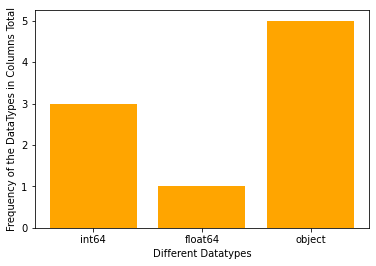

In [17]:
# checking the unique datatypes present inside the dataset with their frequency
unique, count = np.unique(train.dtypes.array,return_counts=True)
for i in range(0,len(unique)):
  unique[i] = str(unique[i])
print(unique)
plt.bar( unique, count, color='orange')
plt.xlabel("Different Datatypes")
plt.ylabel("Frequency of the DataTypes in Columns Total")
plt.show()

In [18]:
#  checking the dataset information regaridng the frequency , min , max etc.
train.describe(include = 'all')

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
count,969640.000000,880040,917280,969640,9.696400e+05,969640.000000,969640,969640,969640.000000
unique,NaN,1840,133,187,NaN,NaN,140,2,NaN
top,NaN,Washington,Texas,US,NaN,NaN,2020-01-23,ConfirmedCases,NaN
freq,NaN,8680,71400,895440,NaN,NaN,6926,484820,NaN
mean,484820.500000,NaN,NaN,NaN,2.720127e+06,0.530870,NaN,NaN,12.563518
std,279911.101846,NaN,NaN,NaN,3.477771e+07,0.451909,NaN,NaN,302.524795
min,1.000000,NaN,NaN,NaN,8.600000e+01,0.047491,NaN,NaN,-10034.000000
25%,242410.750000,NaN,NaN,NaN,1.213300e+04,0.096838,NaN,NaN,0.000000
50%,484820.500000,NaN,NaN,NaN,3.053100e+04,0.349413,NaN,NaN,0.000000
75%,727230.250000,NaN,NaN,NaN,1.056120e+05,0.968379,NaN,NaN,0.000000


In [19]:
#  checking the missing values present inside thr train dataset to evaluate whether how much percentage is empty inside the database
def evaluatingMissingValues(dataset):
  missing = dataset.isnull().sum()
  missing_pourcent = dataset.isnull().sum()/dataset.shape[0]*100
  dic = {
    'mising':missing,
    'missing_pourcent %':missing_pourcent
  }
  frame=pd.DataFrame(dic)
  return frame

#  calling the above method for the train dataset
evaluatingMissingValues(train)

,mising,missing_pourcent %
Id,0,0.000000
County,89600,9.240543
Province_State,52360,5.399942
Country_Region,0,0.000000
Population,0,0.000000
Weight,0,0.000000
Date,0,0.000000
Target,0,0.000000
TargetValue,0,0.000000


In [20]:
# calling the missing values data method on the test dataset
evaluatingMissingValues(test)

,mising,missing_pourcent %
ForecastId,0,0.000000
County,28800,9.240543
Province_State,16830,5.399942
Country_Region,0,0.000000
Population,0,0.000000
Weight,0,0.000000
Date,0,0.000000
Target,0,0.000000


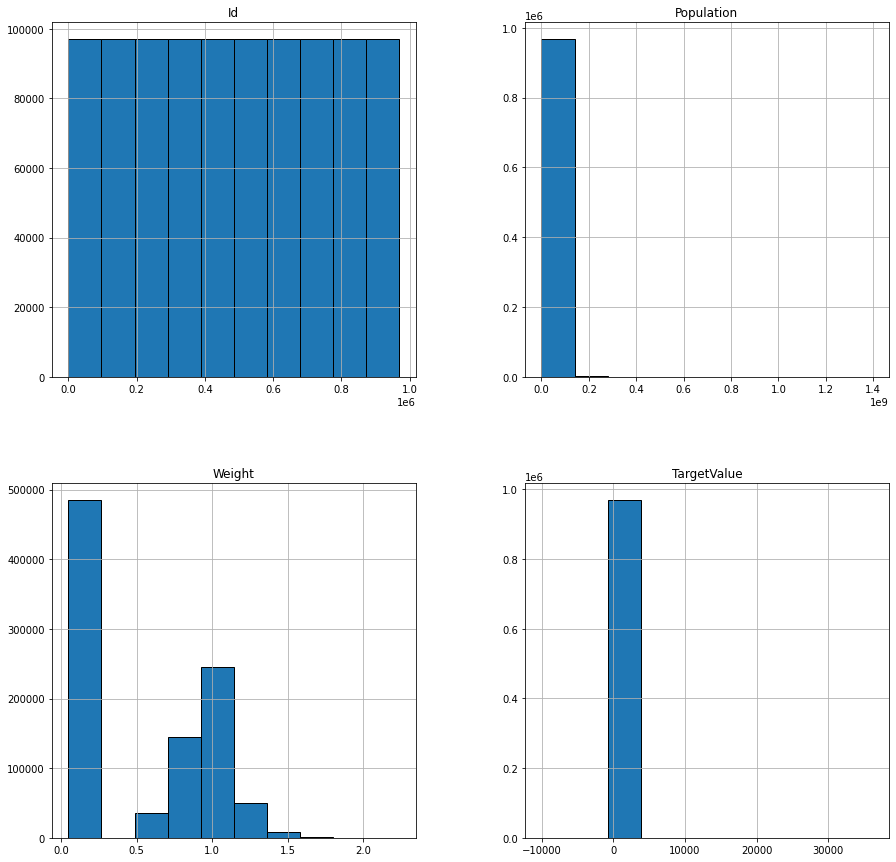

In [21]:
# visualisng the dataset train to check different columsn values distribution
train.hist(figsize=(15,15),edgecolor='black');

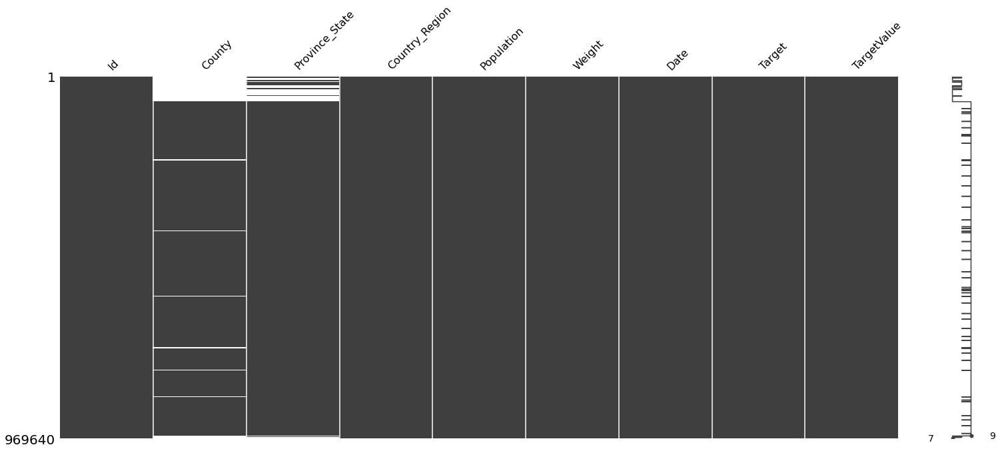

In [22]:
# visualising the missing values using the matrix plot
import missingno as msno
%matplotlib inline
msno.matrix(train)

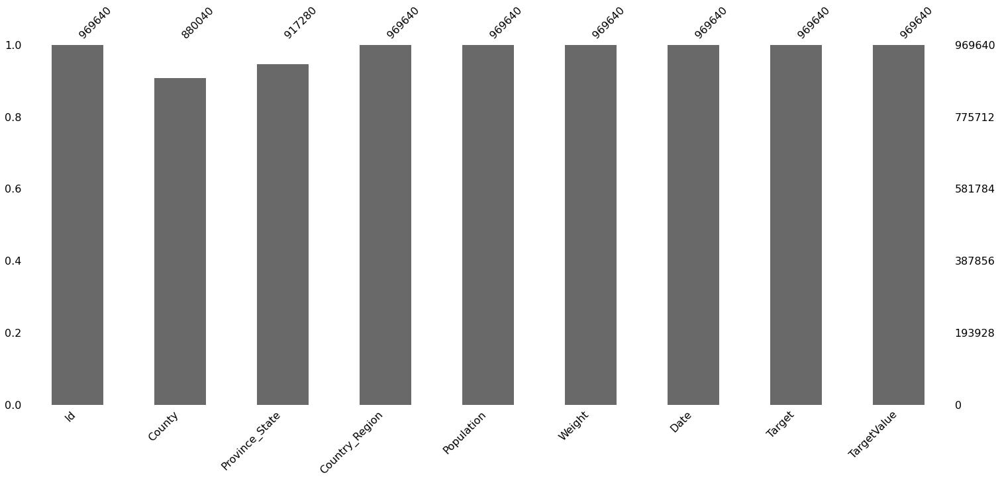

In [23]:
# visualising the missing values using a bar graph in each column in the dataset
msno.bar(train)

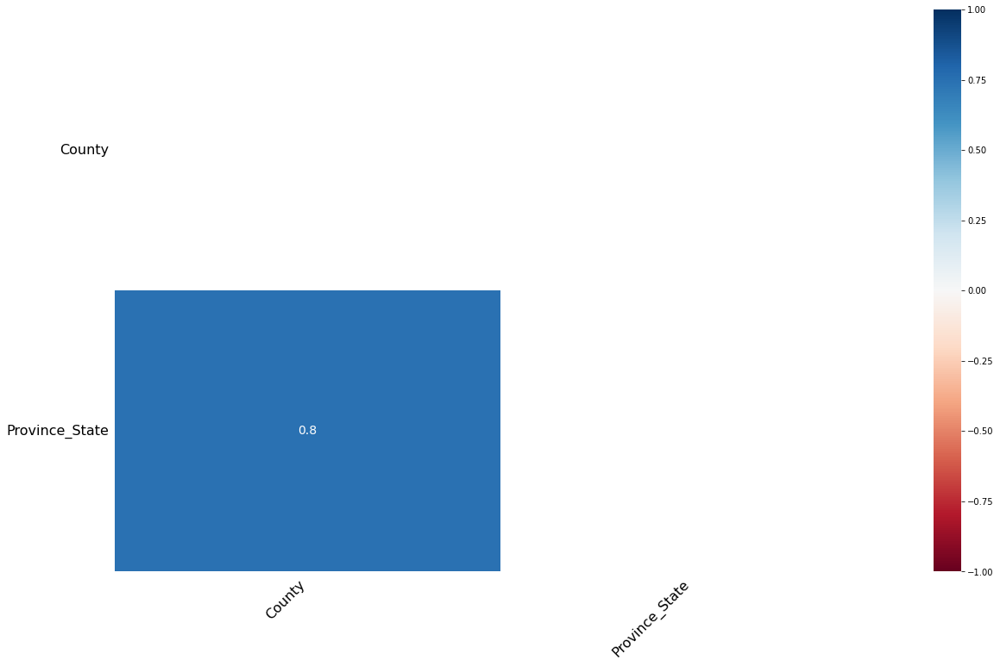

In [24]:
msno.heatmap(train)

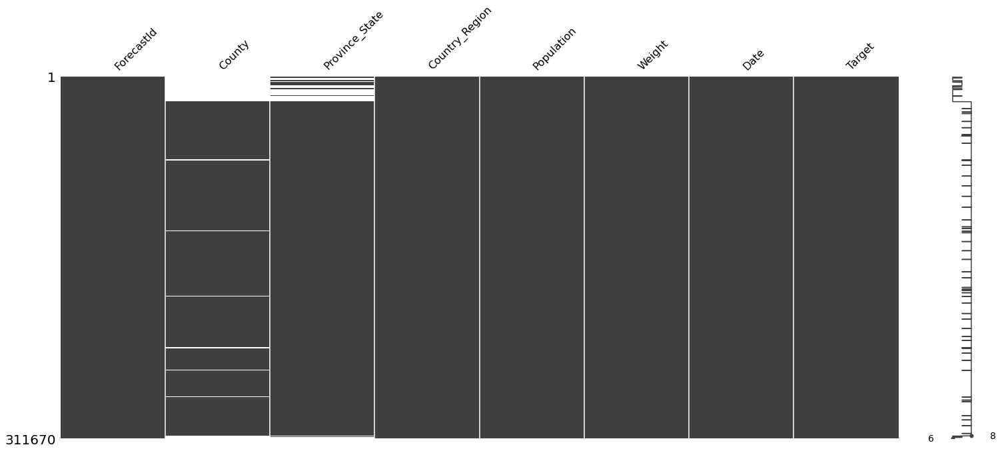

In [25]:
#  visualizing the same things for the test part of the dataset
msno.matrix(test)

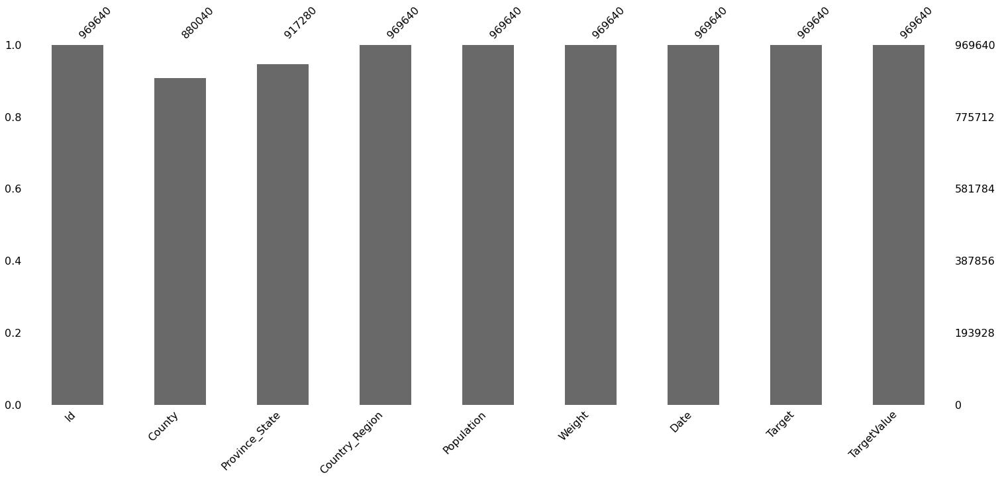

In [26]:
msno.bar(train)

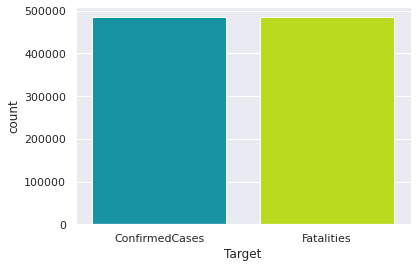

In [27]:
#  checking the distribution of the dependent variable inside the dataset train
#plotting the bar graph for the dependent column which has to be predicted by the model to see how much different variables it has
sns.set_style('white')
sns.set(font_scale=1)
plt.figure()
sns.countplot(x=train['Target'],palette='nipy_spectral')
plt.show()

In [28]:
# checking the country distribution of the dataset train to see different countries affected by covid-19 as per the dataset
fig = px.pie(train, values='TargetValue', names='Country_Region')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



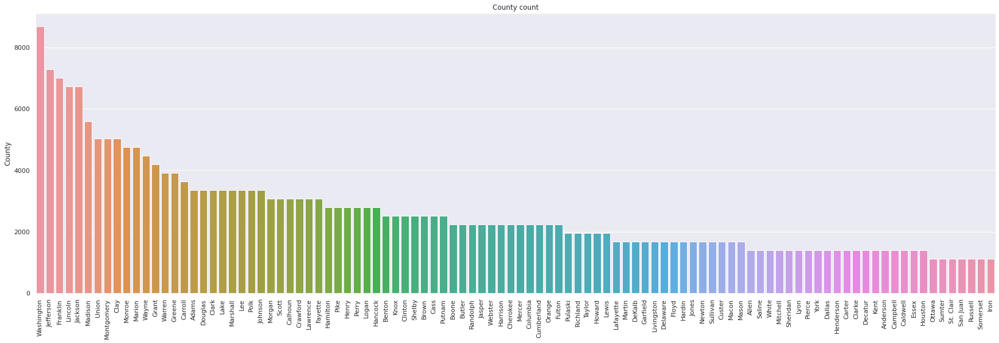

In [29]:
# checking the country count in the train dataset
plt.figure(figsize=(30,9))
county_plot=train.County.value_counts().head(100)
sns.barplot(county_plot.index,county_plot)
plt.xticks(rotation=90)
plt.title('County count');

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



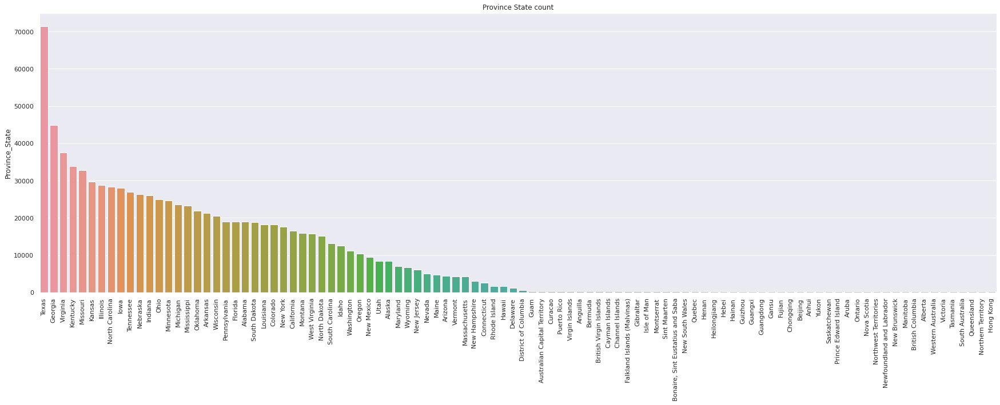

In [30]:
#  checking the province state count inside the dataset train to see different province provided to us
plt.figure(figsize=(30,9))
Province_State_plot=train.Province_State.value_counts().head(100)
sns.barplot(Province_State_plot.index,Province_State_plot)
plt.xticks(rotation=90)
plt.title('Province State count');

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



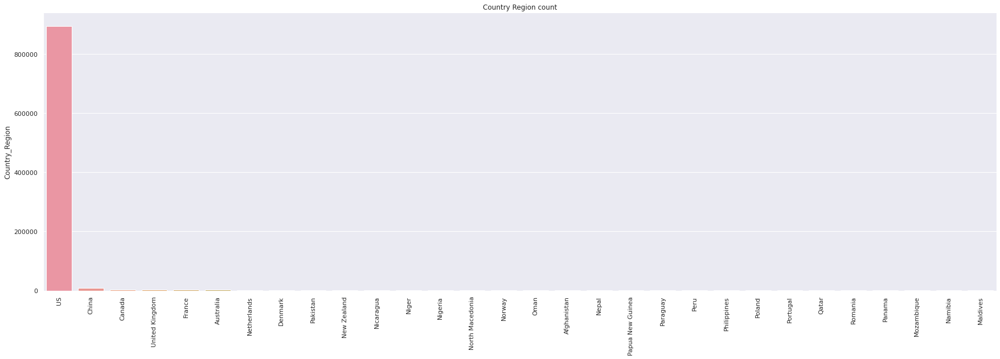

In [31]:
# checking the country region count present inside the dataset train 
plt.figure(figsize=(30,9))
Country_Region_plot=train.Country_Region.value_counts().head(30)
sns.barplot(Country_Region_plot.index,Country_Region_plot)
plt.xticks(rotation=90)
plt.title('Country Region count');

In [32]:
#  evaluating the Confirmed Cases as per from the Target column inside the train dataset and plotting the different countries which 
#  corresponds to the confirmedCases as per the Target column  
confirmed=train[train['Target']=='ConfirmedCases']
fig = px.treemap(confirmed, path=['Country_Region'], values='TargetValue',width=900, height=600)
fig.update_traces(textposition='middle center', textfont_size=15)
fig.update_layout(
    title={
        'text': 'Total Share of Worldwide COVID19 Confirmed Cases across various different country region',
        'y':0.92,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [33]:
#  evaluating the Confirmed Cases as per from the Target column inside the train dataset and plotting the different countries which 
#  corresponds to the Fatalities as per the Target column
dead=train[train['Target']=='Fatalities']
fig = px.treemap(dead, path=['Country_Region'], values='TargetValue',width=900,height=600)
fig.update_traces(textposition='middle center', textfont_size=15)
fig.update_layout(
    title={
        'text': 'Total Share of Worldwide COVID19 Fatalities Affected Countries Plot ',
        'y':0.92,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

In [34]:
#  checing and plotting the graphs of the countries total cases as per the Target Column and presenting the population as well on that
fig = px.treemap(train, path=['Country_Region'], values='TargetValue',
                  color='Population', hover_data=['Country_Region'],
                  color_continuous_scale='matter', title='Current share of Worldwide COVID19 Confirmed Cases')
fig.show()

In [35]:
train.Population.value_counts()

14651       840
2530        840
2356        560
19983       560
2013        560
           ... 
9564        280
66911       280
2648        280
3250        280
14240168    280
Name: Population, Length: 3408, dtype: int64

In [36]:
# grouping the dataset using the date column in that
last_date = train.Date.max()
df_countries = train[train['Date']==last_date]
df_countries = df_countries.groupby('Country_Region', as_index=False)['TargetValue'].sum()
df_countries = df_countries.nlargest(10,'TargetValue')
df_trend = train.groupby(['Date','Country_Region'], as_index=False)['TargetValue'].sum()
df_trend = df_trend.merge(df_countries, on='Country_Region')
df_trend.rename(columns={'Country_Region':'Country', 'TargetValue_x':'Cases'}, inplace=True)

In [37]:
px.line(df_trend, x='Date', y='Cases', color='Country', title='COVID19 Total Cases growth for top 10 worst affected countries')
#  as per the below graph we can conclude that the US is the most affected country from the covid-19

In [38]:
# data PreProcessing
# grouping all of the independent variables together inside the dataset for preprocessing phase in both train and test
train = train.drop(['County','Province_State','Country_Region','Target'],axis=1)
test = test.drop(['County','Province_State','Country_Region','Target'],axis=1)
train

,Id,Population,Weight,Date,TargetValue
0,1,27657145,0.058359,2020-01-23,0
1,2,27657145,0.583587,2020-01-23,0
2,3,27657145,0.058359,2020-01-24,0
3,4,27657145,0.583587,2020-01-24,0
4,5,27657145,0.058359,2020-01-25,0
...,...,...,...,...,...
969635,969636,14240168,0.607106,2020-06-08,0
969636,969637,14240168,0.060711,2020-06-09,27
969637,969638,14240168,0.607106,2020-06-09,0
969638,969639,14240168,0.060711,2020-06-10,6


In [39]:
test

,ForecastId,Population,Weight,Date
0,1,27657145,0.058359,2020-04-27
1,2,27657145,0.583587,2020-04-27
2,3,27657145,0.058359,2020-04-28
3,4,27657145,0.583587,2020-04-28
4,5,27657145,0.058359,2020-04-29
...,...,...,...,...
311665,311666,14240168,0.607106,2020-06-08
311666,311667,14240168,0.060711,2020-06-09
311667,311668,14240168,0.607106,2020-06-09
311668,311669,14240168,0.060711,2020-06-10


In [40]:
#  we are checking for any null values inside the dataset train
train.isnull().sum()

Id             0
Population     0
Weight         0
Date           0
TargetValue    0
dtype: int64

In [41]:
test.isnull().sum()

ForecastId    0
Population    0
Weight        0
Date          0
dtype: int64

In [42]:
# creating a method to change the date column to the different columns to make it more interpretable like from date getting the day, month etc.
def create_features(data):
    data['day'] = data['Date'].dt.day
    data['month'] = data['Date'].dt.month
    data['dayofweek'] = data['Date'].dt.dayofweek
    data['dayofyear'] = data['Date'].dt.dayofyear
    return data

In [43]:
def train_dev_split(data, days):
    #Last days data as dev set
    date = data['Date'].max() - data.timedelta(days=days)
    return data[data['Date'] <= date], data[data['Date'] > date]

In [44]:
#  getting the min and max date from the test dataset
test_date_min = test['Date'].min()
test_date_max = test['Date'].max()

In [45]:
def avoid_data_leakage(df, date=test_date_min):
    return df[df['Date']<date]

In [46]:
# converting the time to integer format
def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day
train['Date']=pd.to_datetime(train['Date'])
test['Date']=pd.to_datetime(test['Date'])

In [47]:
# changing the Date object column to the integer format for the year + month + date
test['Date']=test['Date'].dt.strftime("%Y%m%d")
train['Date']=train['Date'].dt.strftime("%Y%m%d").astype(int)

In [48]:
train

,Id,Population,Weight,Date,TargetValue
0,1,27657145,0.058359,20200123,0
1,2,27657145,0.583587,20200123,0
2,3,27657145,0.058359,20200124,0
3,4,27657145,0.583587,20200124,0
4,5,27657145,0.058359,20200125,0
...,...,...,...,...,...
969635,969636,14240168,0.607106,20200608,0
969636,969637,14240168,0.060711,20200609,27
969637,969638,14240168,0.607106,20200609,0
969638,969639,14240168,0.060711,20200610,6


In [49]:
test

,ForecastId,Population,Weight,Date
0,1,27657145,0.058359,20200427
1,2,27657145,0.583587,20200427
2,3,27657145,0.058359,20200428
3,4,27657145,0.583587,20200428
4,5,27657145,0.058359,20200429
...,...,...,...,...
311665,311666,14240168,0.607106,20200608
311666,311667,14240168,0.060711,20200609
311667,311668,14240168,0.607106,20200609
311668,311669,14240168,0.060711,20200610


In [50]:
#  splitting the dataset inside the dependent and independent variables in it
x_ind = train.iloc[:,:-1].values
y_dep = train.iloc[:,-1].values

In [51]:
#  data splitting into the test and train dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_ind, y_dep, test_size = 0.25, random_state = 0)

In [52]:
#  applying the model on the train portions to validate the model prediction and than plotting the predicted values 
# against the actual values to see the accuracy of the graph
model = RandomForestRegressor(n_jobs=-1)
estimators = 100
model.set_params(n_estimators=estimators)

scores = []

pipeline = Pipeline([('scaler2' , StandardScaler()),
                        ('RandomForestRegressor: ', model)])
pipeline.fit(X_train , y_train)
prediction = pipeline.predict(X_test)

pipeline.fit(X_train, y_train)
scores.append(pipeline.score(X_test, y_test))
plt.figure(figsize=(8,6))

<Figure size 576x432 with 0 Axes>

<Figure size 576x432 with 0 Axes>

In [53]:
# scorecame from the Randomme Forest Regressor is 95 percent as mentioned below
scores

[0.9545207630240362]

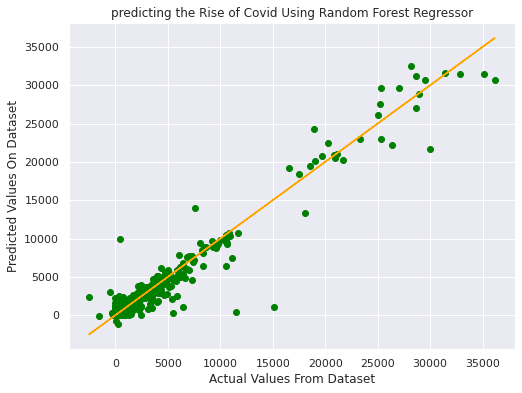

In [54]:
# plotting the graph using the RandomForest Regressor predicted values to check the accuracy and final plot
plt.figure(figsize=(8,6))
plt.plot(y_test,y_test,color='orange')
plt.scatter(y_test,prediction,color='green')
plt.xlabel('Actual Values From Dataset')
plt.ylabel('Predicted Values On Dataset')
plt.title('predicting the Rise of Covid Using Random Forest Regressor')
plt.show()

In [55]:
# applying the XGBoost Regressor
import xgboost as xgb

In [56]:
xgbr= xgb.XGBRegressor(n_estimators=800, learning_rate=0.01, gamma=0, subsample=.7,
                       colsample_bytree=.7, max_depth=10,
                       min_child_weight=0, 
                       objective='reg:squarederror', nthread=-1, scale_pos_weight=1,
                       seed=27, reg_alpha=0.00006, n_jobs=-1)

In [57]:
#  training the model using XGboost algorithm on it 
xgbr.fit(X_train,y_train)

XGBRegressor(colsample_bytree=0.7, learning_rate=0.01, max_depth=10,
             min_child_weight=0, n_estimators=800, n_jobs=-1, nthread=-1,
             objective='reg:squarederror', reg_alpha=6e-05, seed=27,
             subsample=0.7)

In [58]:
# predicting the values using the XGboost algorithm and checking the root mean square value and R2 score of the XGBoost
prediction_xgbr=xgbr.predict(X_test)
print('RMSE_XGBoost Regression=', np.sqrt(metrics.mean_squared_error(y_test,prediction_xgbr)))
print('R2 Score_XGBoost Regression=',metrics.r2_score(y_test,prediction_xgbr))

RMSE_XGBoost Regression= 106.05152917337796
R2 Score_XGBoost Regression= 0.8919319396831986


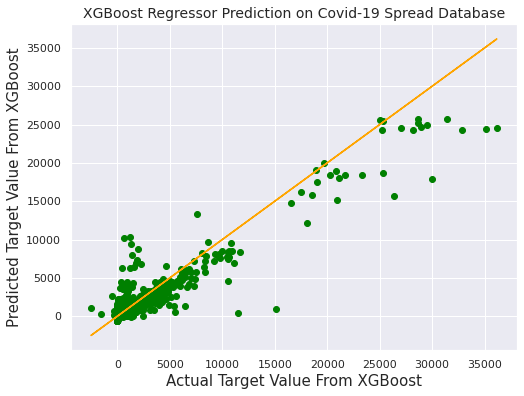

In [60]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=prediction_xgbr, color='green')
plt.plot(y_test,y_test, color='orange')
plt.xlabel('Actual Target Value From XGBoost',fontsize=15)
plt.ylabel('Predicted Target Value From XGBoost',fontsize=15)
plt.title('XGBoost Regressor Prediction on Covid-19 Spread Database',fontsize=14)
plt.show()